## Database statistics for SCI Data publication - Will give the contents of Table 1

In [28]:
import SlideRunner.dataAccess.database
from SlideRunner.dataAccess.database import Database
import os
import numpy as np
import openslide
import cv2

In [5]:
import sqlite3

In [6]:
!pip install slideio

## Read "manually expert labeled" annotations. (a) print list of all tables that are present inside the sqlite database (b) print all entries of a particular table, and (c) save entries into a pandas df for further exploration 

In [8]:
sqliteConnection = sqlite3.connect('MITOS_WSI_CMC_MEL.sqlite')
sql_query = """SELECT name FROM sqlite_master  
  WHERE type='table';"""
cursor = sqliteConnection.cursor()
cursor.execute(sql_query)
print("List of tables\n")
# printing all tables list
print(cursor.fetchall())
     
   
    # Inside Finally Block, If connection is
    # open, we need to close it
if sqliteConnection:
         
        # using close() method, we will close
        # the connection
        sqliteConnection.close()
         
        # After closing connection object, we
        # will print "the sqlite connection is
        # closed"
        print("the sqlite connection is closed")

List of tables

[('Annotations_label',), ('sqlite_sequence',), ('Annotations_coordinates',), ('Annotations',), ('Classes',), ('Persons',), ('Slides',), ('Log',)]
the sqlite connection is closed


In [17]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Annotations_label;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 1, 1, 1, None)
(2, 1, 1, 2, None)
(3, 1, 1, 3, None)
(4, 1, 1, 4, None)
(5, 1, 1, 5, None)
(6, 1, 1, 6, None)
(7, 1, 1, 7, None)
(8, 1, 1, 8, None)
(9, 1, 1, 9, None)
(10, 1, 1, 10, None)
(11, 1, 1, 11, None)
(12, 1, 1, 12, None)
(13, 1, 1, 13, None)
(14, 1, 1, 14, None)
(15, 1, 1, 15, None)
(16, 1, 1, 16, None)
(17, 1, 1, 17, None)
(18, 1, 1, 18, None)
(19, 1, 1, 19, None)
(20, 1, 1, 20, None)
(21, 1, 1, 21, None)
(22, 1, 1, 22, None)
(23, 1, 1, 23, None)
(24, 1, 1, 24, None)
(26, 1, 1, 26, None)
(27, 1, 1, 27, None)
(28, 1, 1, 28, None)
(29, 1, 1, 29, None)
(30, 1, 1, 30, None)
(31, 1, 1, 31, None)
(32, 1, 1, 32, None)
(33, 1, 1, 33, None)
(34, 1, 1, 34, None)
(35, 1, 1, 35, None)
(36, 1, 1, 36, None)
(37, 1, 1, 37, None)
(38, 1, 1, 38, None)
(39, 1, 1, 39, None)
(40, 1, 1, 40, None)
(41, 1, 1, 41, None)
(42, 1, 1, 42, None)
(43, 1, 1, 43, None)
(44, 1, 1, 44, None)
(45, 1, 1, 45, None)
(46, 1, 1, 46, None)
(47, 1, 1, 47, None)
(48, 1, 1, 48, None)
(49, 1, 1, 49, None)
(50, 1, 1,

(51533, 3, 1, 28022, None)
(51534, 2, 2, 24618, None)
(51535, 3, 2, 24618, None)
(51536, 2, 2, 7182, None)
(51537, 3, 2, 7182, None)
(51538, 2, 2, 22269, None)
(51539, 3, 2, 22269, None)
(51540, 2, 2, 21748, None)
(51541, 3, 2, 21748, None)
(51542, 2, 2, 10595, None)
(51543, 3, 2, 10595, None)
(51544, 2, 2, 9187, None)
(51545, 3, 2, 9187, None)
(51546, 2, 2, 8299, None)
(51547, 3, 2, 8299, None)
(51548, 2, 2, 22527, None)
(51549, 3, 2, 22527, None)
(51550, 2, 2, 13922, None)
(51551, 3, 2, 13922, None)
(51552, 2, 2, 34345, None)
(51553, 3, 2, 34345, None)
(51554, 2, 2, 729, None)
(51555, 3, 2, 729, None)
(51556, 2, 2, 7814, None)
(51557, 3, 2, 7814, None)
(51558, 2, 2, 16682, None)
(51559, 3, 2, 16682, None)
(51560, 2, 2, 20324, None)
(51561, 3, 2, 20324, None)
(51562, 2, 2, 2978, None)
(51563, 3, 2, 2978, None)
(51564, 2, 2, 16696, None)
(51565, 3, 2, 16696, None)
(51566, 2, 2, 29466, None)
(51567, 3, 2, 29466, None)
(51568, 2, 2, 22533, None)
(51569, 3, 2, 22533, None)
(51570, 2, 1, 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [3]:
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# Read sqlite query results into a pandas DataFrame
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")
df = pd.read_sql_query("SELECT * from Annotations", con)

# Verify that result of SQL query is stored in the dataframe
print(df.head())

print(df.shape)

print(df['type'].value_counts())

print(df['agreedClass'].value_counts())

con.close()

   uid  slide  type  agreedClass                                  guid  \
0    1      1     1            1  05535b17-a3f3-48f9-ae21-dbf9617efcf1   
1    2      1     1            1  b1c70dda-71fc-4444-ace1-d2dbf7ce9149   
2    3      1     1            1  846da71e-d894-4018-9c23-a0472781a699   
3    4      1     1            1  eea842e0-5739-4143-995f-13053cfb8dfa   
4    5      1     1            1  1c886987-f274-440d-bf8b-9369ef9f6847   

   deleted     lastModified description  
0        0 1585567885.37043        None  
1        0 1585567885.37043        None  
2        0 1585567885.37043        None  
3        0 1585567885.37043        None  
4        0 1585567885.37043        None  
(39868, 8)
1    39867
4        1
Name: type, dtype: int64
1    26526
2    13342
Name: agreedClass, dtype: int64


In [9]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM sqlite_sequence;'):
    print(row)

# Be sure to close the connection
con.close()

('Persons', 4)
('Classes', 3)
('Slides', 22)
('Annotations', 40627)
('Annotations_coordinates', 40632)
('Annotations_label', 121623)
('Log', 40246)


In [10]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Annotations_coordinates;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 21029, 7246, 1, 1, 1, 0)
(2, 21030, 7305, 1, 2, 1, 0)
(3, 20378, 6976, 1, 3, 1, 0)
(4, 21086, 6940, 1, 4, 1, 0)
(5, 23504, 7623, 1, 5, 1, 0)
(6, 15300, 8437, 1, 6, 1, 0)
(7, 24069, 8282, 1, 7, 1, 0)
(8, 14561, 9753, 1, 8, 1, 0)
(9, 14607, 9443, 1, 9, 1, 0)
(10, 15481, 9406, 1, 10, 1, 0)
(11, 19810, 9668, 1, 11, 1, 0)
(12, 20929, 9853, 1, 12, 1, 0)
(13, 20294, 9828, 1, 13, 1, 0)
(14, 20455, 9910, 1, 14, 1, 0)
(15, 15180, 10804, 1, 15, 1, 0)
(16, 15171, 10665, 1, 16, 1, 0)
(17, 21154, 10402, 1, 17, 1, 0)
(18, 20915, 10087, 1, 18, 1, 0)
(19, 20813, 10114, 1, 19, 1, 0)
(20, 20965, 10310, 1, 20, 1, 0)
(21, 21135, 10271, 1, 21, 1, 0)
(22, 20965, 10043, 1, 22, 1, 0)
(23, 19974, 11925, 1, 23, 1, 0)
(24, 20324, 12198, 1, 24, 1, 0)
(26, 21413, 11949, 1, 26, 1, 0)
(27, 16703, 13060, 1, 27, 1, 0)
(28, 19142, 12549, 1, 28, 1, 0)
(29, 20644, 12656, 1, 29, 1, 0)
(30, 20582, 13959, 1, 30, 1, 0)
(31, 21212, 14338, 1, 31, 1, 0)
(32, 17104, 14736, 1, 32, 1, 0)
(33, 24549, 15897, 1, 33, 1, 0)
(34, 178

(31852, 102267, 22755, 8, 31847, 1, 0)
(31853, 104040, 22777, 8, 31848, 1, 0)
(31854, 16430, 23722, 8, 31849, 1, 0)
(31855, 32821, 23187, 8, 31850, 1, 0)
(31856, 75233, 23280, 8, 31851, 1, 0)
(31857, 77055, 23563, 8, 31852, 1, 0)
(31858, 99357, 23613, 8, 31853, 1, 0)
(31859, 99475, 23681, 8, 31854, 1, 0)
(31860, 98764, 23570, 8, 31855, 1, 0)
(31861, 99814, 23161, 8, 31856, 1, 0)
(31862, 106192, 23232, 8, 31857, 1, 0)
(31863, 23233, 23958, 8, 31858, 1, 0)
(31864, 44727, 24568, 8, 31859, 1, 0)
(31865, 49906, 24028, 8, 31860, 1, 0)
(31866, 66955, 24445, 8, 31861, 1, 0)
(31867, 70228, 23887, 8, 31862, 1, 0)
(31868, 76786, 23828, 8, 31863, 1, 0)
(31869, 78226, 24337, 8, 31864, 1, 0)
(31870, 92416, 24397, 8, 31865, 1, 0)
(31871, 99415, 24170, 8, 31866, 1, 0)
(31872, 12625, 24775, 8, 31867, 1, 0)
(31873, 13645, 24941, 8, 31868, 1, 0)
(31874, 29281, 25241, 8, 31869, 1, 0)
(31875, 35153, 25310, 8, 31870, 1, 0)
(31876, 74256, 25096, 8, 31871, 1, 0)
(31877, 77087, 24828, 8, 31872, 1, 0)
(31878, 8

In [11]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Annotations;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 1, 1, 1, '05535b17-a3f3-48f9-ae21-dbf9617efcf1', 0, 1585567885.3704278, None)
(2, 1, 1, 1, 'b1c70dda-71fc-4444-ace1-d2dbf7ce9149', 0, 1585567885.3704278, None)
(3, 1, 1, 1, '846da71e-d894-4018-9c23-a0472781a699', 0, 1585567885.3704278, None)
(4, 1, 1, 1, 'eea842e0-5739-4143-995f-13053cfb8dfa', 0, 1585567885.3704278, None)
(5, 1, 1, 1, '1c886987-f274-440d-bf8b-9369ef9f6847', 0, 1585567885.3704278, None)
(6, 1, 1, 1, 'c6ffc256-a24d-4f1c-b951-db79e0928719', 0, 1585567885.3704278, None)
(7, 1, 1, 1, '86c3e10c-4adf-4765-9c34-86ce3ede8d0c', 0, 1585567885.3704278, None)
(8, 1, 1, 1, '93897268-c222-4f52-9897-14f9f2708da7', 0, 1585567885.3704278, None)
(9, 1, 1, 1, '4c711ecb-3aaf-49c6-849f-4e81eb4d79e3', 0, 1585567885.3704278, None)
(10, 1, 1, 1, 'bf764c0d-ebc1-4eaa-b763-0ab2e2e4d163', 0, 1585567885.3704278, None)
(11, 1, 1, 1, '89309c88-b8a2-4c09-8976-faf1288ae1a3', 0, 1585567885.3704278, None)
(12, 1, 1, 1, 'f19b3816-1918-421d-81f1-9f034fa7cddf', 0, 1585567885.3704278, None)
(13, 1, 1, 1,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [12]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Classes;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 'Mitotic cell look-alike', '#21ff22')
(2, 'Mitotic figure', '#0000ef')


In [13]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Persons;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 'Christof', 0)
(2, 'Robert', 0)
(3, 'Christof and Robert', 0)
(4, 'Taryn Donovan', 0)


In [14]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Slides;'):
    print(row)

# Be sure to close the connection
con.close()

(1, 'a8773be388e12df89edd.svs', 61199, 57462, None, 0, None, None)
(2, '460906c0b1fe17ea5354.svs', None, None, None, 0, None, None)
(3, '2d56d1902ca533a5b509.svs', None, None, None, 0, None, None)
(5, 'd0423ef9a648bb66a763.svs', None, None, None, 0, None, None)
(6, '50cf88e9a33df0c0c8f9.svs', None, None, '', 0, None, None)
(7, 'da18e7b9846e9d38034c.svs', 95399, 84305, '', 0, None, None)
(8, 'd7a8af121d7d4f3fbf01.svs', None, None, '', 0, None, None)
(9, '2191a7aa287ce1d5dbc0.svs', None, None, '', 0, None, None)
(10, '69a02453620ade0edefd.svs', None, None, '', 0, None, None)
(11, 'c4b95da36e32993289cb.svs', None, None, '', 0, None, None)
(12, 'fa4959e484beec77543b.svs', None, None, '', 0, None, None)
(13, '72c93e042d0171a61012.svs', None, None, '', 0, None, None)
(14, '4eee7b944ad5e46c60ce.svs', None, None, '', 0, None, None)
(15, 'b1bdee8e5e3372174619.svs', None, None, '', 0, None, None)
(16, '3d3d04eca056556b0b26.svs', None, None, '', 0, None, None)
(17, '084383c18b9060880e82.svs', Non

In [15]:
# Create a SQL connection to our SQLite database
con = sqlite3.connect("MITOS_WSI_CMC_MEL.sqlite")

cur = con.cursor()

# The result of a "cursor.execute" can be iterated over by row
for row in cur.execute('SELECT * FROM Log;'):
    print(row)

# Be sure to close the connection
con.close()

(1540738884.0, 1, 1436)
(1540738903.0, 2, 1437)
(1540738907.0, 3, 1438)
(1540738973.0, 4, 1439)
(1540738977.0, 5, 1440)
(1540738980.0, 6, 1441)
(1540738994.0, 7, 1442)
(1540738997.0, 8, 1443)
(1540739007.0, 9, 1444)
(1540739033.0, 10, 1445)
(1540739038.0, 11, 1446)
(1540739042.0, 12, 1447)
(1540739062.0, 13, 1448)
(1540739155.0, 14, 1449)
(1540739159.0, 15, 1450)
(1540739161.0, 16, 1451)
(1540739171.0, 17, 1452)
(1540739173.0, 18, 1453)
(1540739185.0, 19, 1454)
(1540739187.0, 20, 1455)
(1540739248.0, 21, 1456)
(1540739251.0, 22, 1457)
(1540739292.0, 23, 1458)
(1540739295.0, 24, 1459)
(1540739306.0, 25, 1460)
(1540739318.0, 26, 1461)
(1540739419.0, 27, 1462)
(1540739428.0, 28, 1463)
(1540739492.0, 29, 1464)
(1540739508.0, 30, 1465)
(1540739510.0, 31, 1466)
(1540739512.0, 32, 1467)
(1540739527.0, 33, 1468)
(1540739548.0, 34, 1469)
(1540739550.0, 35, 1470)
(1540739617.0, 36, 1471)
(1540739629.0, 37, 1472)
(1540739632.0, 38, 1473)
(1540739634.0, 39, 1474)
(1540739687.0, 40, 1475)
(15407396

## Look at a slide file. Slideio and Openslide are different packages avaialble to get information on a slide and view the slide.

In [2]:
pwd

'/Users/sushmitavijofficecomputer/DeepPathology/Capstone-Shared-v3/MITOS_WSI_CMC/databases'

In [23]:
import slideio
slide = slideio.open_slide('../WSI/022857018aa597374b6c.svs','SVS')
num_scenes = slide.num_scenes
scene = slide.get_scene(0)
scene
print(num_scenes, scene.name, scene.rect, scene.num_channels)

1 Image (0, 0, 109799, 84591) 3


In [24]:
slide = openslide.open_slide('../WSI/022857018aa597374b6c.svs')

In [29]:
import matplotlib.pyplot as plt
import numpy as np
lu = (14000,11300)
img = np.array(slide.read_region(lu, 0, [800,800]))[:,:,0:4]

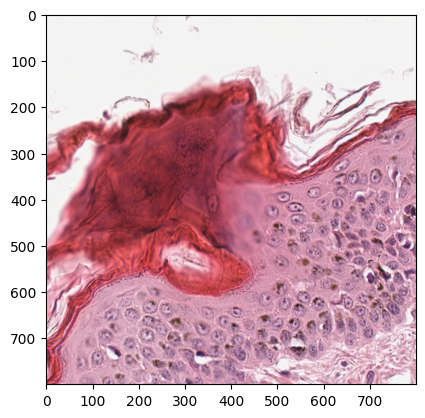

In [30]:
plt.imshow(img)

In [37]:
slide.level_count

4

In [38]:
slide.dimensions

(109799, 84591)

In [39]:
slide.level_dimensions

((109799, 84591), (27449, 21147), (6862, 5286), (3431, 2643))

In [40]:
slide.level_downsamples

(1.0, 4.000125578846618, 16.001928897602184, 32.00385779520437)

In [41]:
slide.properties

<_PropertyMap {'aperio.AppMag': '40', 'aperio.DSR ID': '130.133.91.37', 'aperio.Date': '10/18/18', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '022857018aa597374b6c', 'aperio.Focus Offset': '0.000000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '50208', 'aperio.Left': '19.603071', 'aperio.LineAreaXOffset': '0.003040', 'aperio.LineAreaYOffset': '-0.011652', 'aperio.LineCameraSkew': '-0.000450', 'aperio.MPP': '0.2533', 'aperio.OriginalHeight': '84691', 'aperio.OriginalWidth': '112240', 'aperio.ScanScope ID': 'VETWE12MIC', 'aperio.SessonMode': 'NR', 'aperio.StripeWidth': '1840', 'aperio.Time': '21:45:18', 'aperio.Time Zone': 'GMT+02:00', 'aperio.Title': '022857018aa597374b6c', 'aperio.Top': '22.895548', 'aperio.User': '00000000-0000-0000-0000-000000000000', 'openslide.comment': 'Aperio Image Library v12.0.15 ..112240x84691 [0,100 109799x84591] (240x240) J2K/KDU Q=70|AppMag = 40|StripeWidth = 1840|ScanScope

In [42]:
slide.associated_images

<_AssociatedImageMap {'macro': <PIL.Image.Image image mode=RGBA size=1600x657 at 0x7F889924B8B0>, 'thumbnail': <PIL.Image.Image image mode=RGBA size=996x768 at 0x7F889ABA0C10>}>

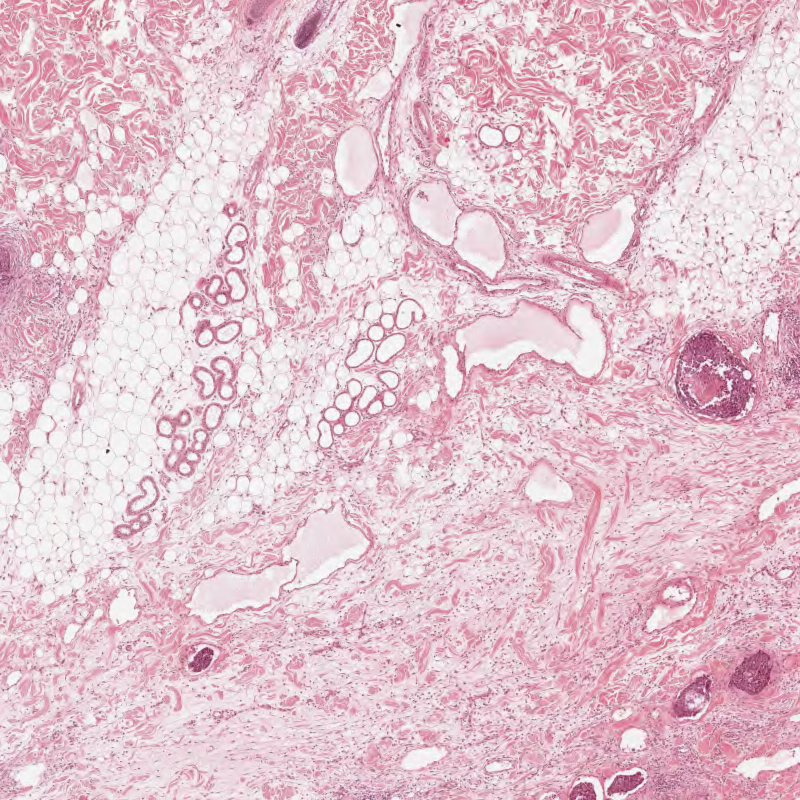

In [45]:
#location (tuple) – (x, y) tuple giving the top left pixel in the level 0 reference frame
#level (int) – the level number
#size (tuple) – (width, height) tuple giving the region size

slide.read_region((20000,20000), 2, (800,800))

In [73]:
slide2 = openslide.open_slide('../WSI/2d56d1902ca533a5b509.svs')

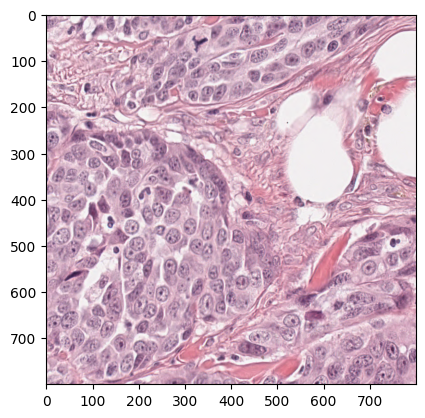

In [74]:
import matplotlib.pyplot as plt
import numpy as np
lu = (14000,11300)
img = np.array(slide.read_region(lu, 0, [800,800]))[:,:,0:4]
plt.imshow(img)

## Combine info in database with images

In [49]:
DB = Database().open('MITOS_WSI_CMC_MEL.sqlite')

slideid = DB.findSlideWithFilename('022857018aa597374b6c.svs','')
DB.loadIntoMemory(slideid)

In [50]:
for anno in DB.annotations.keys():
    print(anno,':',DB.annotations[anno])

24873 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f88994854f0>
24874 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8898e95520>
24875 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f88980c2d30>
24876 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f88980c2c40>
24877 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8899274a90>
24878 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8899274e80>
24879 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8898f578e0>
24880 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8898f576d0>
24881 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f8898f57e20>
24882 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f889924beb0>
24883 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f889924b7f0>
24884 : <SlideRunner.dataAccess.annotations.spotAnnotation object

In [53]:
DB.annotations[24873].coordinates

array([[56566,  4404],
       [56616,  4454]])

In [54]:
DB.annotations[24873].agreedClass

1

In [55]:
DB.annotations[24873].getDescription(DB)

[['Position', 'x1=56591, y1=4429'],
 ['Anno 1', 'Mitotic cell look-alike (Christof)'],
 ['Anno 2', 'Mitotic cell look-alike (Robert)'],
 ['Anno 3', 'Mitotic cell look-alike (Christof and Robert)'],
 ['Agreed Class', 'Mitotic cell look-alike']]

In [76]:
#load a different slide
slideid = DB.findSlideWithFilename('../WSI/3d3d04eca056556b0b26.svs','')
DB.loadIntoMemory(slideid)
for anno in DB.annotations.keys():
    print(anno,':',DB.annotations[anno])

19899 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887bf7efa0>
19900 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f889abf0940>
19901 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f889abf09a0>
19902 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d446070>
19903 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d4460a0>
19905 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d4460d0>
19906 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d446160>
19907 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d446190>
19908 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d4461c0>
19909 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d41b910>
19910 : <SlideRunner.dataAccess.annotations.spotAnnotation object at 0x7f887d41b670>
19911 : <SlideRunner.dataAccess.annotations.spotAnnotation object

In [77]:
#see the coordinates of the polygonAnnotation
DB.annotations[396845].coordinates

array([[ 64320,   2592],
       [ 43056,    811],
       [ 25577,    366],
       [  4926,   1423],
       [  1697,   9662],
       [  1363,  25638],
       [  1920,  47959],
       [  5539,  66440],
       [ 12218,  74512],
       [ 16894,  78687],
       [ 23351,  80246],
       [ 28750,  83196],
       [ 39048,  83363],
       [ 45060,  84810],
       [ 51183,  85423],
       [ 60757,  77796],
       [ 62873,  66719],
       [ 77791,  75625],
       [ 96327,  84309],
       [101560,  82305],
       [108017,  47180],
       [107572,  37216],
       [107460,  20739],
       [109551,  17553],
       [109656,  15381],
       [109306,  10770],
       [108967,   8400],
       [108209,   5178],
       [105699,   3812],
       [101893,   5236],
       [ 85647,   3398],
       [ 78041,   2066],
       [ 67133,   2468],
       [ 64320,   2592],
       [ 64320,   2592]])

In [78]:
#check the agreed class of this polygon
DB.annotations[396845].agreedClass

4

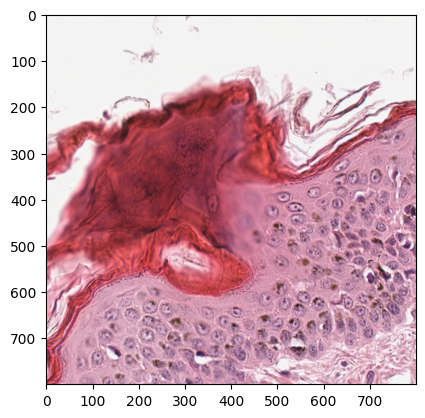

In [57]:
#if the slide had a circle annotation then we could use the code below to showcase the area
#however, in our case this particular file has only spot annotations so the image looks the same
from SlideRunner.dataAccess.annotations import ViewingProfile
DB.annotations[24873].draw(image=img, leftUpper=lu, zoomLevel=1., thickness=5, vp=ViewingProfile())
plt.imshow(img)

## Query all databases for the respective classes. Joint query to have all in the same order.

In [58]:
DB = Database().open('MITOS_WSI_CMC_ODAEL_TR.sqlite')
DB.execute('ATTACH `MITOS_WSI_CMC_MEL.sqlite` as MEL;')
DB.execute('ATTACH `MITOS_WSI_CMC_CODAEL_TR_ROI.sqlite` as CODAEL;')

ODAEL = DB.execute("""
SELECT * FROM (
SELECT filename, MitoticFigures, MitoticFigureLookalikes FROM 
(SELECT COUNT(*) as MitoticFigureLookalikes, slide from Annotations where agreedClass==1 group by slide) as cls1
LEFT JOIN (SELECT COUNT(*) as MitoticFigures, slide from Annotations where agreedClass==2 group by slide) as cls2 on cls2.slide == cls1.slide
LEFT JOIN Slides on Slides.uid == cls2.slide order by mitoticFigures) as ODAEL
LEFT JOIN 
(
SELECT filename, MitoticFigures, MitoticFigureLookalikes FROM (
SELECT COUNT(*) as MitoticFigures, slide from MEL.Annotations where agreedClass==2 group by slide) as cls2
LEFT JOIN (SELECT COUNT(*) as MitoticFigureLookalikes, slide from MEL.Annotations where agreedClass==1 group by slide) as cls1 on cls1.slide == cls2.slide
LEFT JOIN MEL.Slides on Slides.uid == cls2.slide order by mitoticFigures
) as MEL on MEL.filename == ODAEL.filename
LEFT JOIN 
(
SELECT filename, MitoticFigures, MitoticFigureLookalikes FROM 
(SELECT COUNT(*) as MitoticFigureLookalikes, slide from CODAEL.Annotations where agreedClass==1 group by slide) as cls1
LEFT JOIN (SELECT COUNT(*) as MitoticFigures, slide from CODAEL.Annotations where agreedClass==2 group by slide) as cls2 on cls2.slide == cls1.slide
LEFT JOIN MEL.Slides on Slides.uid == cls2.slide order by mitoticFigures
) as CODAEL on CODAEL.filename == ODAEL.filename order by CODAEL.mitoticFigures


""").fetchall()

Output everything in LateX table format

In [59]:
DB.execute("""SELECT COUNT(*) as MitoticFigureLookalikes, slide from Annotations where agreedClass==1 group by slide""").fetchall()

[(591, 1),
 (2480, 2),
 (365, 3),
 (1596, 5),
 (2550, 6),
 (1354, 7),
 (2373, 8),
 (2609, 9),
 (1505, 10),
 (2944, 11),
 (4408, 12),
 (680, 13),
 (196, 14),
 (1832, 15),
 (2933, 16),
 (547, 17),
 (742, 18),
 (1725, 19),
 (472, 20),
 (3106, 21),
 (1127, 22)]

In [60]:
ODAEL[0]

('4eee7b944ad5e46c60ce.svs',
 61,
 196,
 '4eee7b944ad5e46c60ce.svs',
 47,
 114,
 '4eee7b944ad5e46c60ce.svs',
 64,
 193)

In [65]:
dbTumor = Database()

dbTumor.open('./MITOS_WSI_CMC_CODAEL_TR_ROI.sqlite')
totalarea = 0
totalmit = 0
totalnonmit = 0
totalmit_mel, totalnonmit_mel = 0,0
totalmit_odael, totalnonmit_odael = 0,0
for idx, (filename, mitA, nonmitA, _, mit,nonmit, _,  mitC,nonmitC) in enumerate(ODAEL):

    dbTSlide = dbTumor.findSlideWithFilename(os.path.basename(filename), slidepath='')
    dbTumor.loadIntoMemory(dbTSlide)
    
    slide = openslide.open_slide('../WSI/'+filename)


    positiveId = dbTumor.findClassidOfClass('Tumor region')[0][0]
    import matplotlib.path as p

    micronsPerPixel = slide.properties[openslide.PROPERTY_NAME_MPP_X]
    mpp_scaled = float(slide.level_downsamples[-1]) * float(micronsPerPixel)  

    slideActiveMap = np.zeros((slide.level_dimensions[-1][::-1]))
    ds = slide.level_downsamples[-1]
    for anno in dbTumor.annotations.keys():
        if (dbTumor.annotations[anno].agreedLabel()==positiveId) and (type(dbTumor.annotations[anno]) == type(dbTumor.annotations[anno]) == SlideRunner.dataAccess.annotations.polygonAnnotation):
            co = dbTumor.annotations[anno].coordinates
            p3 = np.int32([np.asarray(co)/ds])
            cv2.fillPoly(slideActiveMap, p3,color=[255] )

    for anno in dbTumor.annotations.keys():
        if not (dbTumor.annotations[anno].agreedLabel()==positiveId) and (type(dbTumor.annotations[anno]) == type(dbTumor.annotations[anno]) == SlideRunner.dataAccess.annotations.polygonAnnotation):
            co = dbTumor.annotations[anno].coordinates
            p3 = np.int32([np.asarray(co)/ds])
            cv2.fillPoly(slideActiveMap, p3,color=[0] )
    mm2 = np.sum(slideActiveMap>0)*mpp_scaled*mpp_scaled/1E6
    totalarea += mm2
    totalmit += mitC
    totalnonmit += nonmitC
    
    totalmit_mel, totalnonmit_mel = totalmit_mel+mit, totalnonmit_mel+nonmit
    totalmit_odael, totalnonmit_odael = totalmit_odael+mitA, totalnonmit_odael+nonmitA
    
    fname = filename.replace('_','\\_')
    print(f"{idx+1} & {fname} & {mm2:.2f}\,$\\mathrm"+"{mm2}"+f"^2$ & {mit:,d} / {mitA:,d} / {mitC:,d} & {nonmit:,d} / {nonmitA:,d} / {nonmitC:,d} & {'test' if str(dbTSlide) in test_slides else 'train'} \\\\ ")
    

1 & 4eee7b944ad5e46c60ce.svs & 66.06\,$\mathrm{mm2}^2$ & 47 / 61 / 64 & 114 / 196 / 193 & test \\ 
2 & a8773be388e12df89edd.svs & 37.01\,$\mathrm{mm2}^2$ & 64 / 71 / 74 & 204 / 591 / 588 & train \\ 
3 & deb768e5efb9d1dcbc13.svs & 187.43\,$\mathrm{mm2}^2$ & 92 / 96 / 84 & 287 / 472 / 484 & train \\ 
4 & e09512d530d933e436d5.svs & 214.97\,$\mathrm{mm2}^2$ & 87 / 98 / 102 & 602 / 742 / 738 & test \\ 
5 & 72c93e042d0171a61012.svs & 26.29\,$\mathrm{mm2}^2$ & 130 / 151 / 140 & 375 / 680 / 691 & train \\ 
6 & 2d56d1902ca533a5b509.svs & 49.32\,$\mathrm{mm2}^2$ & 139 / 155 / 153 & 228 / 365 / 367 & test \\ 
7 & 084383c18b9060880e82.svs & 41.71\,$\mathrm{mm2}^2$ & 157 / 173 / 160 & 404 / 547 / 560 & train \\ 
8 & da18e7b9846e9d38034c.svs & 253.10\,$\mathrm{mm2}^2$ & 187 / 210 / 211 & 991 / 1,354 / 1,353 & train \\ 
9 & 13528f1921d4f1f15511.svs & 339.93\,$\mathrm{mm2}^2$ & 283 / 301 / 292 & 963 / 1,127 / 1,136 & test \\ 
10 & d0423ef9a648bb66a763.svs & 273.88\,$\mathrm{mm2}^2$ & 378 / 411 / 354 &

In [66]:
#non mitotic figures as found by the manual experts, by the odael model and by the codael models
totalnonmit_mel, totalnonmit_odael, totalnonmit

(26526, 36135, 36379)

In [67]:
#mitotic figures as found by the manual experts, by the odael model and by the codael models
totalmit_mel, totalmit_odael, totalmit


(13342, 14151, 13907)

## And finally the question: What is the total area?

In [68]:
print('Total area: ',totalarea,'mm^2')
print('mitotic figures in CODAEL data set',totalmit)
print('nonmitotic figures in CODAEL data set',totalnonmit)


Total area:  4360.07788915561 mm^2
mitotic figures in CODAEL data set 13907
nonmitotic figures in CODAEL data set 36379


In [71]:
#print('Total area: ',totalarea_mel,'mm^2')
print('mitotic figures in MEL data set',totalmit_mel)
print('nonmitotic figures in MEL data set',totalnonmit_mel)

mitotic figures in MEL data set 13342
nonmitotic figures in MEL data set 26526


In [72]:
#print('Total area: ',totalarea_mel,'mm^2')
print('mitotic figures in ODAEL data set',totalmit_odael)
print('nonmitotic figures in ODAEL data set',totalnonmit_odael)

mitotic figures in ODAEL data set 14151
nonmitotic figures in ODAEL data set 36135
